# Birdsong Separation Using FIR Filters
## 1: DSP & Python
> This experiment is adapted from [DSP-PYNQ](https://github.com/Xilinx/DSP-PYNQ) and uses FIR IP generated by AMD Vitis HLS to perform audio filtering operations

### 1.1Check our signals

`birds.wav` is an audio file containing the sounds of two species of birds recorded by Stuart Fisher and available at [here](https://www.xeno-canto.org/28039).


In [1]:
from IPython.display import Audio
Audio("./media/birds.wav")


Playing the audio above, we can find a mix of two bird calls:
- The bird with the lower frequency and shorter call duration is the Curlew.
- The bird with the higher frequency and longer call duration is the Chaffinch.

We want to separate the two bird's by means of digital signal processing and use hardware functions to accelerate them.

<div style='max-width: 1005px;'>
<div style='width:40%; float:left; text-align:center;'>
    <img src="./image/curlew.jpg"/>
    <b>Curlew</b> <br/>Photo by Vedant Raju Kasambe <br/> <a href="https://creativecommons.org/licenses/by-sa/4.0/deed.en">Creative Commons Attribution-Share Alike 4.0</a>
</div>
<div style='width:40%; float:right; text-align:center;'>
    <img src="./image/chaffinch.jpg"/>
    <b>Chaffinch</b> <br/>Photo by Charles J Sharp <br/> <a href="https://creativecommons.org/licenses/by/3.0/deed.en">Creative Commons Attribution 3.0</a>
</div>
</div>

### 1.2 Reading in the signal
Let's use SciPy's `wavfile` module to do the read-in of the signal, fs is the sampling frequency and aud_in is the raw data.

In [2]:
from scipy.io import wavfile

fs, aud_in = wavfile.read("./media/birds.wav")

Let's look at the sampling frequency size, the type, length and format of the raw data.

The sampling frequency is the standard 44.1KHz, and the data is saved in numpy.ndarray in int16 format, with a total of 554112 sampling points.

In [4]:
print(fs)
print(type(aud_in))
print(len(aud_in))
print(aud_in.dtype)
print(aud_in[10000:10009])

44100
<class 'numpy.ndarray'>
554112
int16
[-37  25 128 210 183 202 278 310 300]


### 1.3 Plotting Spectrogram
To facilitate observation, we can create some interactive plotting components to help visualize the data.

Plotting the spectrum of the data in Notebook is a good choice, which helps to observe the frequency change of the signal over time.

First, we disable FutureWarnings from scipy, which are warnings against features in Python packages that will be deprecated in the future. 

In [5]:
import numpy as np
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

We use some underlying API of plotly to plot the graphs and some modules of scipy to get the spectrum data.

The plotting of the graphs will take some time.

In [6]:
import plotly.graph_objs as go
import plotly.offline as py
from scipy.signal import spectrogram, decimate

def plot_spectrogram(samples, fs, decimation_factor=3, max_heat=50, mode='2D'):
    
    # Optionally decimate input
    if decimation_factor>1:
        samples_dec = decimate(samples, decimation_factor, zero_phase=True)
        fs_dec = int(fs / decimation_factor)
    else:
        samples_dec = samples
        fs_dec = fs

    # Calculate spectrogram (an array of FFTs from small windows of our signal)
    f_label, t_label, spec_data = spectrogram(
        samples_dec, fs=fs_dec, mode="magnitude"
    )
    
    # Make a plotly heatmap/surface graph
    layout = go.Layout(
        height=500,
        # 2D axis titles
        xaxis=dict(title='Time (s)'),
        yaxis=dict(title='Frequency (Hz)'),
        # 3D axis titles
        scene=dict(
            xaxis=dict(title='Time (s)'),
            yaxis=dict(title='Frequency (Hz)'),
            zaxis=dict(title='Amplitude')
        )
    )
    
    trace = go.Heatmap(
        z=np.clip(spec_data,0,max_heat),
        y=f_label,
        x=t_label
    ) if mode=='2D' else go.Surface(
        z=spec_data,
        y=f_label,
        x=t_label
    )
    
    py.iplot(dict(data=[trace], layout=layout))


plot_spectrogram(aud_in, fs, mode='2D')

Looking at the graph above, we can clearly distinguish between the two bird sounds - the curlew sound is between 1.2-2.6 kHz while the chaffinch sound is between 3-5 kHz.

Here, we can first design a filter in Python to extract the **chaffinch sound**, i.e. filter out the curlew sound between 1.2-2.6 kHz.

---------

### 1.4 Generating the parameters of the FIR filter

We can use the signal processing module in SciPy to generate the parameters of the FIR filter and implement the filtering function:

- `firwin` can be used to calculate the filter parameters that meet the design requirements
- `freqz` can be used to calculate the frequency response of the filter

In order to filter out the higher frequency sound, a high-pass filter is needed to suppress the signal below 2.6 kHz. We leave some margin and set the cutoff frequency to 2.8kHz.

In [7]:
from scipy.signal import freqz, firwin

nyq = fs / 2.0
taps = 99

# Design high-pass filter with cut-off at 2.8 kHz
hpf_coeffs = firwin(taps, 2800/nyq, pass_zero=False)

freqs, resp = freqz(hpf_coeffs, 1)

sample_freqs = np.linspace(0, nyq, len(np.abs(resp)))

We can visualize the frequency response curve, which helps us to better design the filter.

Text(0, 0.5, 'Normalised amplitude')

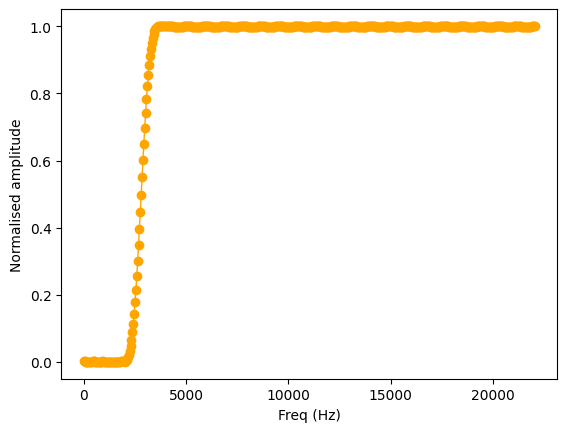

In [8]:
import matplotlib.pyplot as plt

plt.plot(sample_freqs, abs(resp), linewidth=1, color="orange", marker="o")
plt.xlabel("Freq (Hz)")
plt.ylabel("Normalised amplitude")

The filter has 99 parameters and is saved in float64 format.

In [9]:
len(hpf_coeffs)

99

View some of the parameters.

In [10]:
hpf_coeffs[0:9]

array([-3.33912973e-04, -1.58154938e-04,  5.64697472e-05,  2.92705880e-04,
        5.25410677e-04,  7.20013809e-04,  8.34195940e-04,  8.23730019e-04,
        6.52233264e-04])

## 2: Load the overlay and run the application on the PYNQ framework

To facilitate the hardware implementation, we convert the original float64 format to int32 by quantizing it simply.

In [11]:
hpf_coeffs_quant = np.array(hpf_coeffs)
hpf_coeffs_hw = np.int32(hpf_coeffs_quant/np.max(abs(hpf_coeffs_quant)) * 2**15 - 1)

The final coefficients that will be written to the IP are as follows.

In [12]:
hpf_coeffs_hw

array([  -13,    -6,     1,     9,    18,    26,    30,    29,    23,
          10,    -8,   -32,   -55,   -75,   -86,   -82,   -62,   -25,
          26,    84,   140,   182,   200,   183,   129,    40,   -75,
        -202,  -317,  -398,  -424,  -377,  -254,   -58,   187,   452,
         693,   863,   915,   812,   532,    69,  -558, -1309, -2128,
       -2942, -3676, -4261, -4637, 32767, -4637, -4261, -3676, -2942,
       -2128, -1309,  -558,    69,   532,   812,   915,   863,   693,
         452,   187,   -58,  -254,  -377,  -424,  -398,  -317,  -202,
         -75,    40,   129,   183,   200,   182,   140,    84,    26,
         -25,   -62,   -82,   -86,   -75,   -55,   -32,    -8,    10,
          23,    29,    30,    26,    18,     9,     1,    -6,   -13])

###  2.1 Loading Overlay

The Overlay module encapsulates the interface for the ARM CPU to interact with the PL part of the FPGA.

- We can load the hardware design we just generated onto the PL with the simple `Overlay()` method
- With the `overlay.fir_wrap_0` statement, we can interact with the IP in the form of an accessed Python object

In [14]:
from pynq import Overlay
overlay = Overlay("../prj/baseline/overlay/fir_base.bit")
fir = overlay.fir_wrap_0

ModuleNotFoundError: No module named 'pynq'

### 2.2 Allocating memory for IP use
The `pynq.allocate` function is used to allocate memory space that can be used by the IP in PL.
- Before the IP in PL can access DRAM, some memory must be reserved for it to be used by the IP. Allocation size and address
- We allocate memory for the input, output and weight sections separately, with data type int32
- `pynq.allocate` will allocate physically contiguous memory and return a `pynq.Buffer` indicating that a buffer has been allocated

In [13]:
from pynq import allocate
sample_len = len(aud_in)
input_buffer = allocate(shape=(sample_len,), dtype='i4')
output_buffer = allocate(shape=(sample_len,), dtype='i4')
coef_buffer = allocate(shape=(99,), dtype='i4')

Take the audio data and coefficient data from python's local memory and copy them to the memory we just allocated.

In [14]:
np.copyto(input_buffer, np.int32(aud_in))
np.copyto(coef_buffer, hpf_coeffs_hw)

We can see that buffers are essentially numpy arrays as well, but provide some physical address properties.

In [15]:
input_buffer[10000:10009]

PynqBuffer([-37,  25, 128, 210, 183, 202, 278, 310, 300])

In [16]:
coef_buffer[0:9]

PynqBuffer([-13,  -6,   1,   9,  18,  26,  30,  29,  23])

In [17]:
coef_buffer.physical_address

377786368

### 2.3 Configuring IP

According to our setup of the IP interface, it has four input and output ports:

- 0x1c, the address of the input data
- 0x10, the address of the output data
- 0x30, the address of the filter coefficients
- 0x28, the length of the data to be processed

We can use the `write` method of the IP directly to write the address of the just allocated memory space to the corresponding location of the IP.

In [18]:
fir.write(0x1c, input_buffer.physical_address)
fir.write(0x10, output_buffer.physical_address)
fir.write(0x30, coef_buffer.physical_address)

For the data length, we can write the value directly in the corresponding register.

In [19]:
fir.write(0x28, sample_len)

### 2.4 Starting IP

The control signal is located at address 0x00, which we can write and read to control whether the IP start and listen is completed.

In [15]:
import time

fir.write(0x00, 0x01)
start_time = time.time()
while True:
    reg = fir.read(0x00)
    if reg != 1:
        break
end_time = time.time()

print("Duration：{}s".format(end_time - start_time))

NameError: name 'fir' is not defined

The results have been written to the `output_buffer`, which we can view.

In [21]:
output_buffer[10000:10009]

PynqBuffer([-4340999,  2073422,  5686747,  -114713,  -862652,   491182,
             1283565,  4466583,  4497105])

### 2.5 Visualization Results

Still using the above-mentioned plotting component, we visualize the results of the hardware function

- It can be seen that the lower frequencies are better removed compared to the original signal
- Due to the quantization of the parameters, the values are generally large

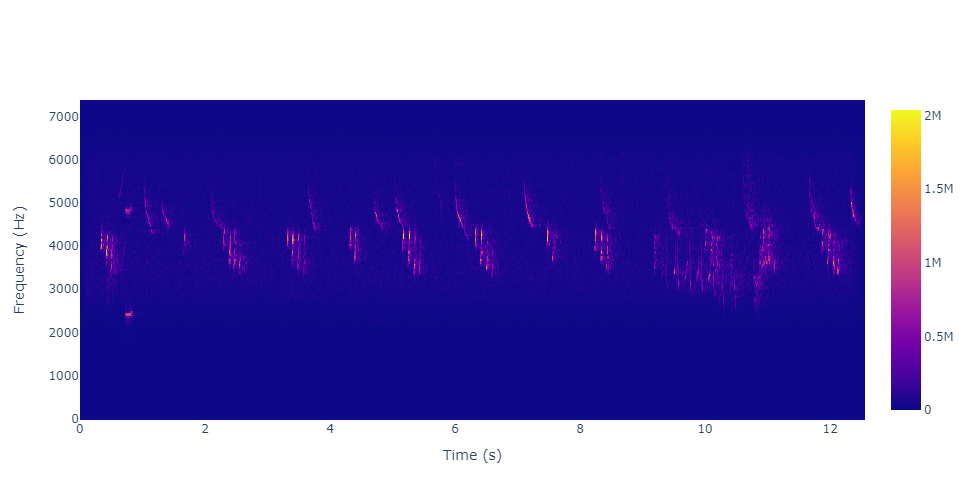

In [22]:
plot_spectrogram(output_buffer, fs, mode='2D', max_heat=np.max(abs(output_buffer)))

We can then scale the output, write the result to the audio `hpf_hw.wav` and listen to it, and we can see that the curlew sound has been successfully removed.

In [23]:
from IPython.display import Audio

scaled = np.int16(output_buffer/np.max(abs(output_buffer)) * 2**15 - 1)
wavfile.write('./media/hpf_hw.wav', fs, scaled)
Audio('hpf_hw.wav')

---------------------------------------
<p align="center">Copyright&copy; 2024 Advanced Micro Devices</p>